# Inception model explanations, t1

## First we need dataframes for every subject

In [1]:
import sys
sys.path.append('../')

In [17]:
# import os
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
# os.environ["CUDA_VISIBLE_DEVICES"] = "2"

import pandas as pd
import numpy as np
import utils
import keras

%matplotlib inline

# DEFINE GRAPH
from importlib import reload
reload(utils)

pd.set_option('max_colwidth', 800) 

In [5]:
# Data paths
rgb_path = '../data/jpg_320_180_2fps/'
of_path = 'no'

# Hyperparameters
input_width = 320
input_height = 180
seq_length = 1
seq_stride = 1
batch_size = 1
COLOR = True
nb_labels = 2

# Data augmentation
aug_flip = 0
aug_crop = 0
aug_light = 0

nb_input_dims = 4

subject_ids = pd.read_csv('../metadata/horse_subjects.csv')['Subject'].values
channels = 3

In [6]:
from utils import ArgsProxy
args = ArgsProxy(rgb_path, of_path, input_height, input_width,
                 seq_length, seq_stride, batch_size, nb_labels,
                 aug_flip, aug_crop, aug_light, nb_input_dims)

In [7]:
import data_handler as dathand
dh = dathand.DataHandler(path=args.data_path,
                         of_path=args.of_path,
                         clip_list_file='videos_overview_missingremoved.csv',
                         data_columns=['Pain'],  # Here one can append f. ex. 'Observer'
                         image_size=(args.input_height, args.input_width),
                         seq_length=args.seq_length,
                         seq_stride=args.seq_stride,
                         batch_size=args.batch_size,
                         color=COLOR,
                         nb_labels=args.nb_labels,
                         aug_flip=args.aug_flip,
                         aug_crop=args.aug_crop,
                         aug_light=args.aug_light,
                         nb_input_dims=args.nb_input_dims)

In [8]:
import utils
subject_dfs = utils.read_or_create_subject_dfs(dh, args, subject_ids)

../data/jpg_320_180_2fps/
../data/jpg_320_180_2fps/
../data/jpg_320_180_2fps/
../data/jpg_320_180_2fps/
../data/jpg_320_180_2fps/
../data/jpg_320_180_2fps/


In [9]:
sequence_df = utils.get_sequence(args=args, subject_dfs=subject_dfs, subject=4)
y = sequence_df['Pain'].values
image_paths = sequence_df['Path'].values

Chose subject  4
Start index in subject dataframe:  3726


In [10]:
from keras.utils import np_utils
label_onehot = np_utils.to_categorical(y, num_classes=args.nb_labels)
batch_label = label_onehot.reshape(args.batch_size, -1)
batch_img = np.concatenate(utils.read_images_and_return_list(args, image_paths, 'local'), axis=1)

## Now that we have frames from all subjects, we can load the model we want to test.

In [11]:
# Choose a model to work on
best_model_path = '../models/BEST_MODEL_inception_4d_input_from_scratch_rmsprop_LSTMunits_None_CONVfilters_None_dense512_320x180jpg2fps_bs100_rmsprop_all_aug_v4_t1_run1_gc_rerun.h5'


In [12]:
from keras import backend as K
import tensorflow as tf

tf.reset_default_graph()
K.clear_session()
    
images = tf.placeholder(tf.float32, [batch_size, args.input_width, args.input_height, channels])
labels = tf.placeholder(tf.float32, [batch_size, 2])

model = utils.InceptionNetwork(images, from_scratch=0, path=best_model_path)

Loading model...
Finished loading model. Building layers...


In [12]:
print(len(model.layers))
for i in range(0, 314):
    print(i)
    print(model.layers[i].name)
    print('INPUT')
    print(model.layers[i].get_input_at(0))
    print('')
    print('OUTPUT')
    print(model.layers[i].get_output_at(0))
    print('')
    

314
0
input_2
INPUT
Tensor("input_2:0", shape=(?, ?, ?, 3), dtype=float32)

OUTPUT
Tensor("input_2:0", shape=(?, ?, ?, 3), dtype=float32)

1
conv2d_1
INPUT
Tensor("input_2:0", shape=(?, ?, ?, 3), dtype=float32)

OUTPUT
Tensor("conv2d_1/convolution:0", shape=(?, ?, ?, 32), dtype=float32)

2
batch_normalization_1
INPUT
Tensor("conv2d_1/convolution:0", shape=(?, ?, ?, 32), dtype=float32)

OUTPUT
Tensor("batch_normalization_1/cond/Merge:0", shape=(?, ?, ?, 32), dtype=float32)

3
activation_1
INPUT
Tensor("batch_normalization_1/cond/Merge:0", shape=(?, ?, ?, 32), dtype=float32)

OUTPUT
Tensor("activation_1/Relu:0", shape=(?, ?, ?, 32), dtype=float32)

4
conv2d_2
INPUT
Tensor("activation_1/Relu:0", shape=(?, ?, ?, 32), dtype=float32)

OUTPUT
Tensor("conv2d_2/convolution:0", shape=(?, ?, ?, 32), dtype=float32)

5
batch_normalization_2
INPUT
Tensor("conv2d_2/convolution:0", shape=(?, ?, ?, 32), dtype=float32)

OUTPUT
Tensor("batch_normalization_2/cond/Merge:0", shape=(?, ?, ?, 32), dtype=float

Tensor("batch_normalization_75/cond/Merge:0", shape=(?, ?, ?, 192), dtype=float32)

239
activation_71
INPUT
Tensor("batch_normalization_71/cond/Merge:0", shape=(?, ?, ?, 192), dtype=float32)

OUTPUT
Tensor("activation_71/Relu:0", shape=(?, ?, ?, 192), dtype=float32)

240
activation_75
INPUT
Tensor("batch_normalization_75/cond/Merge:0", shape=(?, ?, ?, 192), dtype=float32)

OUTPUT
Tensor("activation_75/Relu:0", shape=(?, ?, ?, 192), dtype=float32)

241
conv2d_72
INPUT
Tensor("activation_71/Relu:0", shape=(?, ?, ?, 192), dtype=float32)

OUTPUT
Tensor("conv2d_72/convolution:0", shape=(?, ?, ?, 320), dtype=float32)

242
conv2d_76
INPUT
Tensor("activation_75/Relu:0", shape=(?, ?, ?, 192), dtype=float32)

OUTPUT
Tensor("conv2d_76/convolution:0", shape=(?, ?, ?, 192), dtype=float32)

243
batch_normalization_72
INPUT
Tensor("conv2d_72/convolution:0", shape=(?, ?, ?, 320), dtype=float32)

OUTPUT
Tensor("batch_normalization_72/cond/Merge:0", shape=(?, ?, ?, 320), dtype=float32)

244
batch_normal

In [13]:
sess = K.get_session()  # Grab the Keras session where the weights are initialized.

print('model preds: ', model.preds)

# cost = (-1) * tf.reduce_sum(tf.multiply(labels, tf.log(model.preds)), axis=1)
cost = (-1) * tf.reduce_sum(tf.multiply(labels, tf.log(model.preds)), axis=1)

print('cost: ', cost)


y_c = tf.reduce_sum(tf.multiply(model.dense_2, labels), axis=1)
# y_c = tf.reduce_sum(tf.multiply(model.dense_1, labels), axis=1)

print('y_c: ', y_c)


# target_conv_layer = model.c_86  # Choose which layer to study
# target_conv_layer = model.c_94  # Here: last conv.
target_conv_layer = model.mixed10 


print('TYPE tcl: ', type(target_conv_layer))

print('tcl: ', target_conv_layer)


target_conv_layer_grad = tf.gradients(y_c, target_conv_layer)[0]
print('tcl grad: ', target_conv_layer_grad)

print('tclg: ', target_conv_layer_grad)
    
gb_grad = tf.gradients(cost, images)[0]  # Guided backpropagation back to input layer

model preds:  Tensor("activation_95_1/Sigmoid:0", shape=(1, 2), dtype=float32)
cost:  Tensor("mul_1:0", shape=(1,), dtype=float32)
y_c:  Tensor("Sum_1:0", shape=(1,), dtype=float32)
TYPE tcl:  <class 'tensorflow.python.framework.ops.Tensor'>
tcl:  Tensor("mixed10_1/concat:0", shape=(1, 8, 4, 2048), dtype=float32)
tcl grad:  Tensor("gradients/global_average_pooling2d_1_1/Mean_grad/truediv:0", shape=(1, 8, 4, 2048), dtype=float32)
tclg:  Tensor("gradients/global_average_pooling2d_1_1/Mean_grad/truediv:0", shape=(1, 8, 4, 2048), dtype=float32)


In [19]:
def run_on_one_sequence(sess, model, batch_img):
    with sess.as_default():
        prob = sess.run(model.preds,
                        feed_dict={images: batch_img,
                                   K.learning_phase(): 0})

        print(prob)
        
        gb_grad_value, target_conv_layer_value, target_conv_layer_grad_value = sess.run([gb_grad, target_conv_layer, target_conv_layer_grad],
              feed_dict={images: batch_img,
              labels: batch_label,
              K.learning_phase(): 0})

#         print('tcl: ')
#         print(target_conv_layer_value)
#         print('')
#         print('tclg: ')
#         print(target_conv_layer_grad_value)
        
        utils.visualize_overlays_4D(batch_img, target_conv_layer_value,
                           target_conv_layer_grad_value)

# Inception predictions for subject 0

Chose subject  1
Start index in subject dataframe:  8833
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_1/frame_001456.jpg     1
[[1. 0.]]
tcl: 
[[[[ 526.12427  1831.0717      0.       ... 1726.1484      0.
       0.      ]
   [  71.04566  4073.8086      0.       ... 2099.625       0.
       0.      ]
   [   0.       4871.983       0.       ... 2060.5532      0.
       0.      ]
   [   0.       4716.8296   1527.4689   ... 2306.9543    991.1178
       0.      ]]

  [[1036.6604   2659.802       0.       ... 2290.643       0.
       0.      ]
   [1184.3684   4849.392       0.       ... 2712.3562      0.
       0.      ]
   [   0.       6127.597       0.       ... 2606.414     151.50458
       0.      ]
   [   0.       5798.9824      0.       ... 2814.9382   1697.941
       0.      ]]

  [[1107.4067   2579.6255      0.       ... 3310.7703      0.
       0.      ]
   [ 440.9404   4460.186       0.       ... 3817.1628      0.
       0.   

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


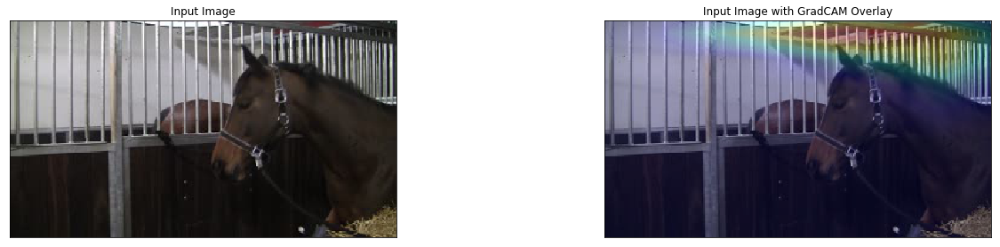

In [19]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  5284
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_001529.jpg     0
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)
conv output shape: (8, 4, 2048)
grads_val shape: (8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


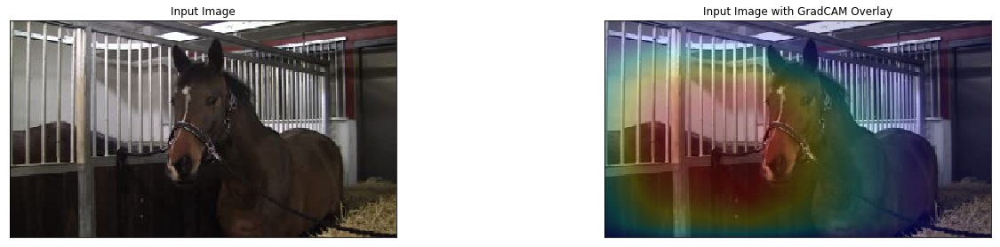

In [22]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  5594
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_001839.jpg     0
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)
conv output shape: (8, 4, 2048)
grads_val shape: (8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


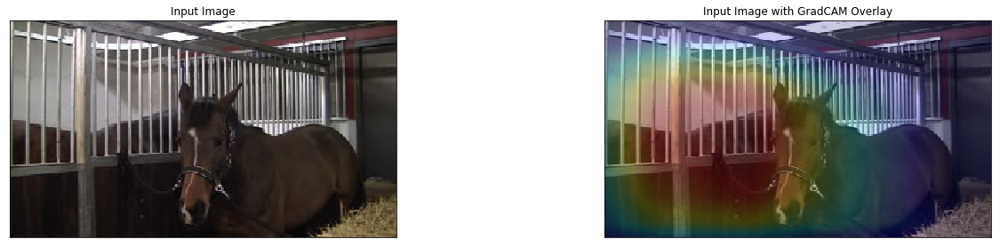

In [23]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  8761
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_1/frame_001384.jpg     1
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)
conv output shape: (8, 4, 2048)
grads_val shape: (8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


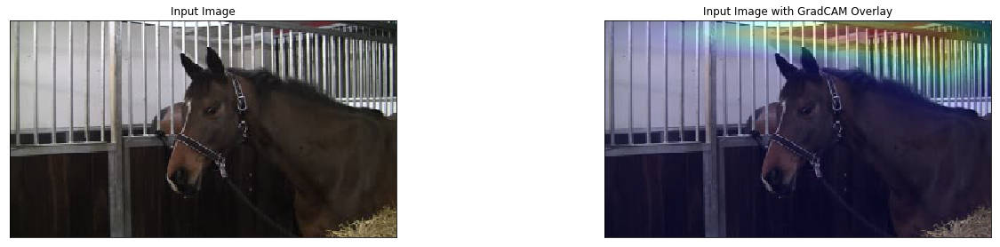

In [24]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  5886
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_002131.jpg     0
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)
conv output shape: (8, 4, 2048)
grads_val shape: (8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


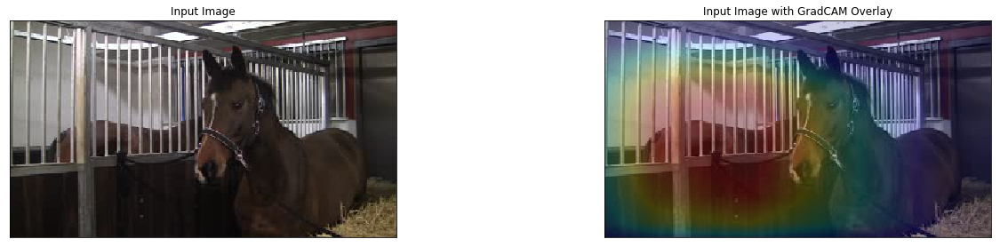

In [25]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  3252
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1b/frame_000587.jpg     0
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)
conv output shape: (8, 4, 2048)
grads_val shape: (8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


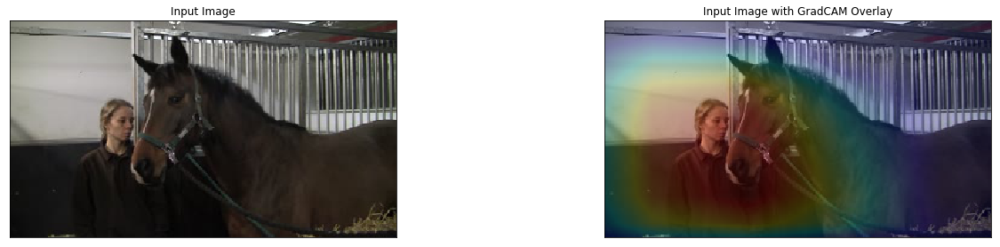

In [26]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  48
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_000049.jpg     0
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)
conv output shape: (8, 4, 2048)
grads_val shape: (8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


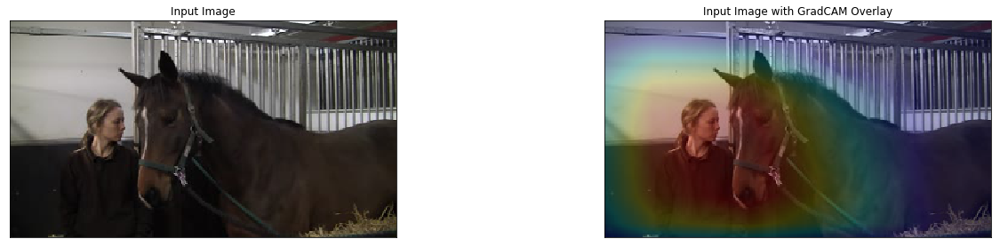

In [27]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  1140
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_001141.jpg     0
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)
conv output shape: (8, 4, 2048)
grads_val shape: (8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


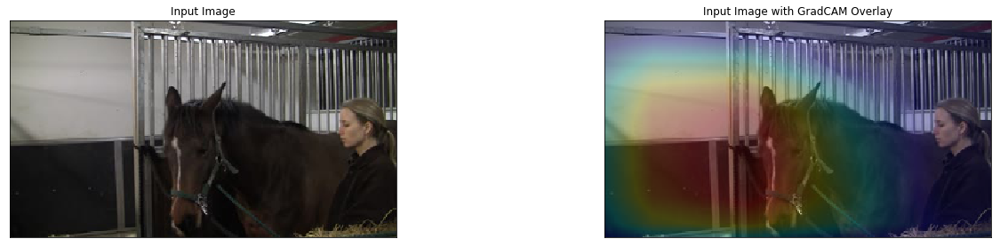

In [16]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  6382
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_002627.jpg     0
[[1. 0.]]
(1, 8, 4, 2048)
(1, 8, 4, 2048)


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


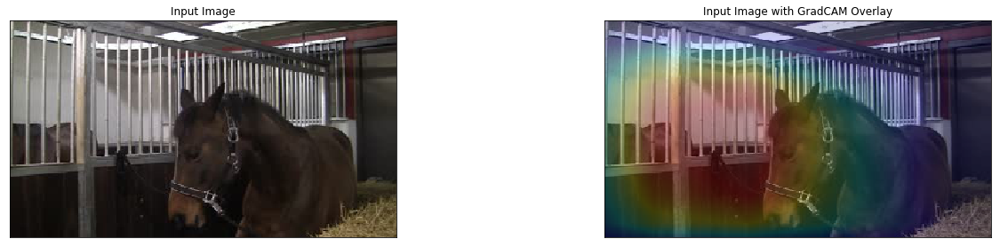

In [18]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  9179
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_2/frame_000122.jpg     1
[[1. 0.]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


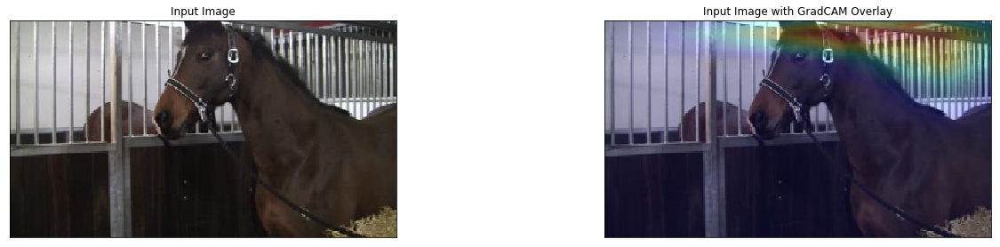

In [20]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

In [21]:
import warnings
warnings.filterwarnings('ignore')

Chose subject  1
Start index in subject dataframe:  5336
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_001581.jpg     0
[[1. 0.]]


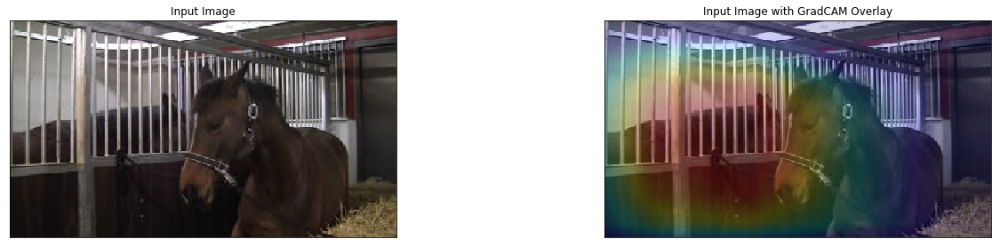

In [22]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  1403
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_001404.jpg     0
[[1. 0.]]


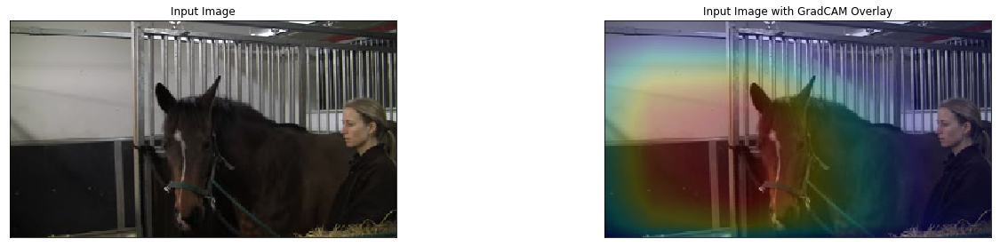

In [23]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  5088
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_001333.jpg     0
[[1. 0.]]


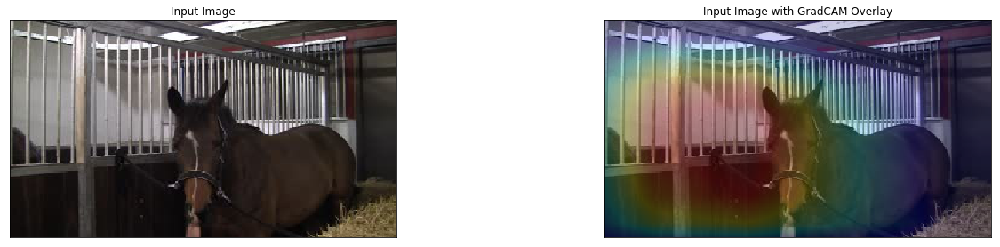

In [24]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  3356
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1b/frame_000691.jpg     0
[[1. 0.]]


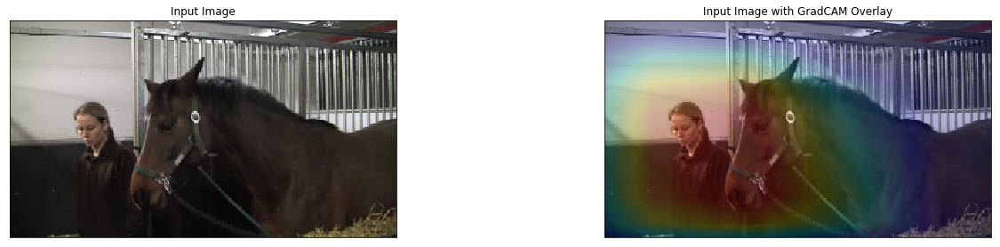

In [25]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)

batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  1200
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_001201.jpg     0
[[1. 0.]]


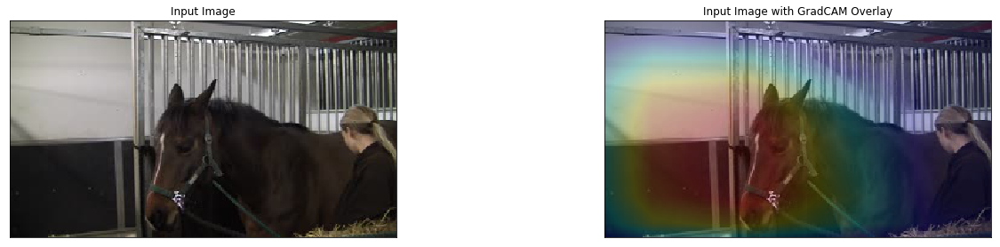

In [26]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  7169
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2b/frame_000750.jpg     0
[[1. 0.]]


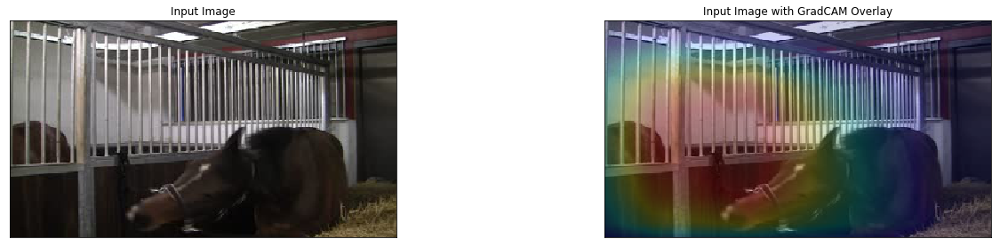

In [27]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  11224
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_000547.jpg     1
[[1. 0.]]


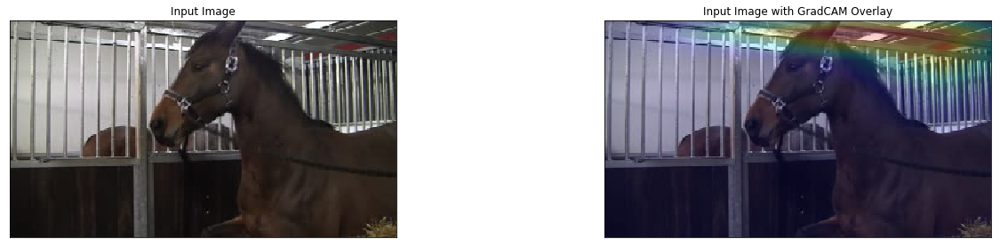

In [28]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  12032
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_001355.jpg     1
[[1. 0.]]


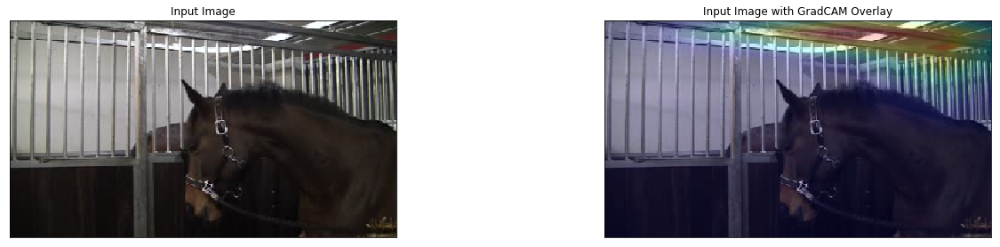

In [29]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  7002
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2b/frame_000583.jpg     0
[[1. 0.]]


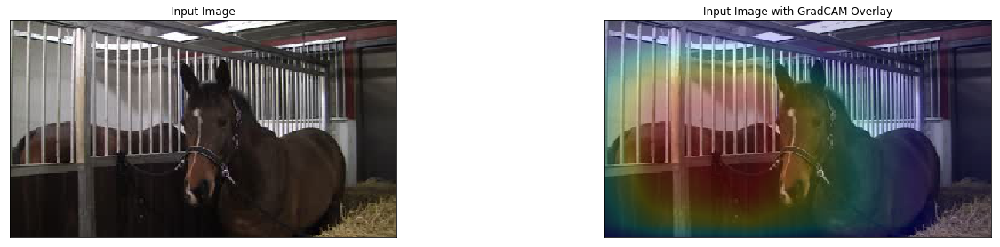

In [30]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  8408
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_1/frame_001031.jpg     1
[[1. 0.]]


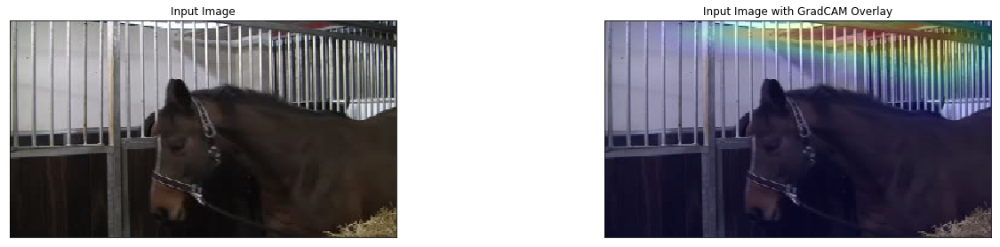

In [31]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  12057
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_001380.jpg     1
[[1. 0.]]


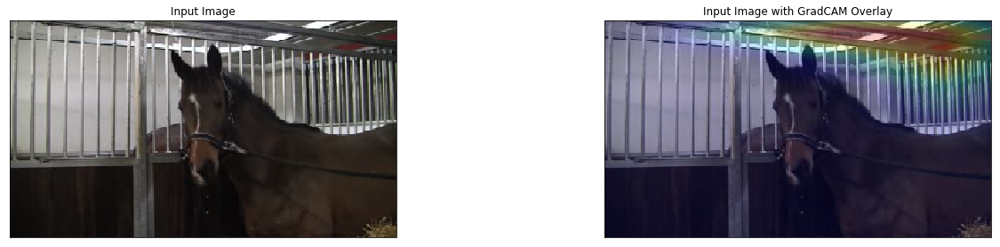

In [32]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  8610
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_1/frame_001233.jpg     1
[[1. 0.]]


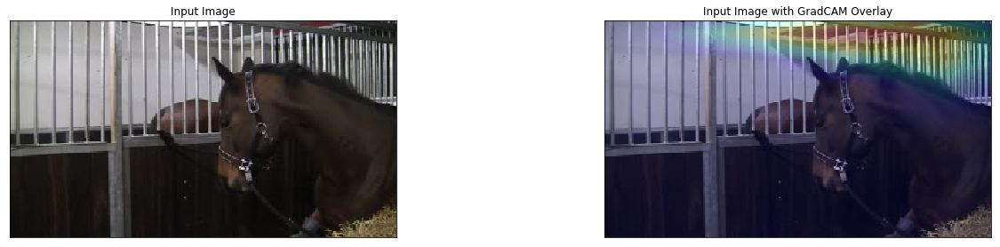

In [33]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  2825
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1b/frame_000160.jpg     0
[[1. 0.]]


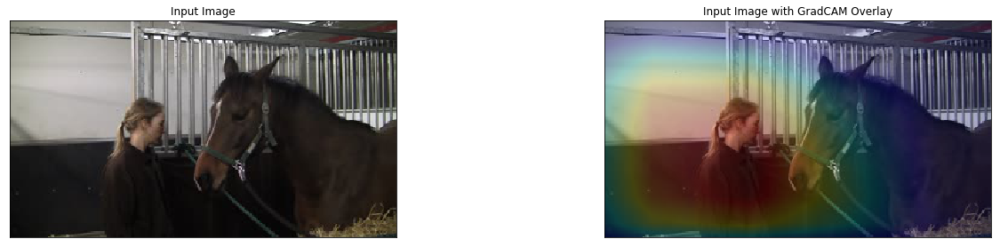

In [34]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  7273
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2b/frame_000854.jpg     0
[[1. 0.]]


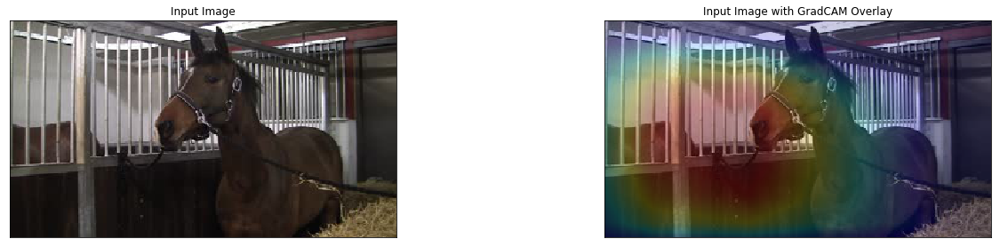

In [35]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  6108
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_002353.jpg     0
[[1. 0.]]


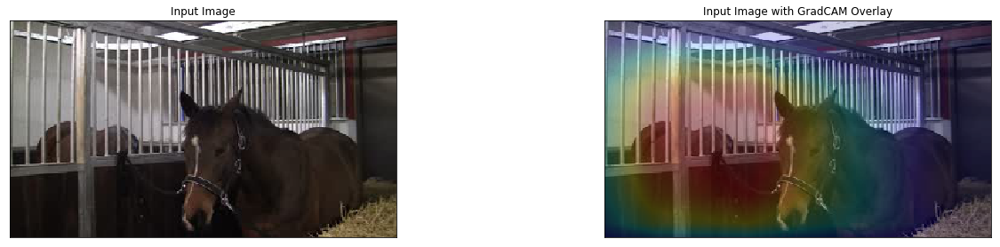

In [36]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  9220
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_2/frame_000163.jpg     1
[[1. 0.]]


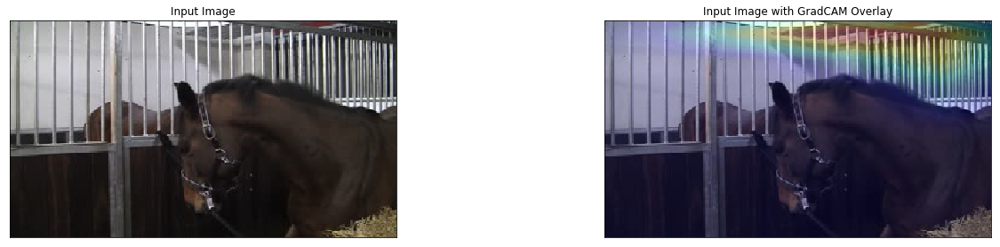

In [37]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  7205
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2b/frame_000786.jpg     0
[[1. 0.]]


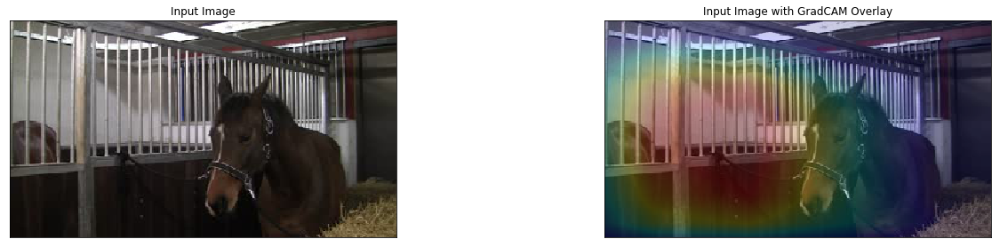

In [38]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  6087
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_002332.jpg     0
[[1. 0.]]


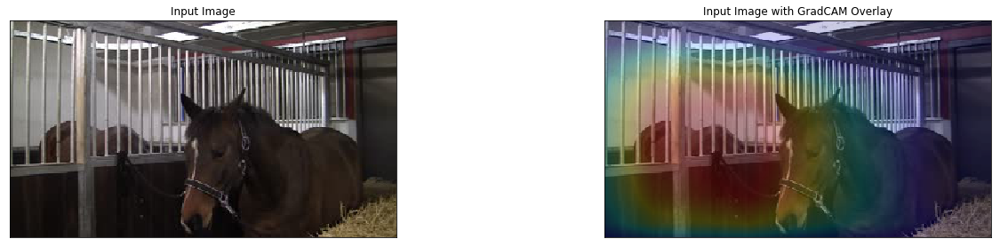

In [39]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  12066
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_001389.jpg     1
[[1. 0.]]


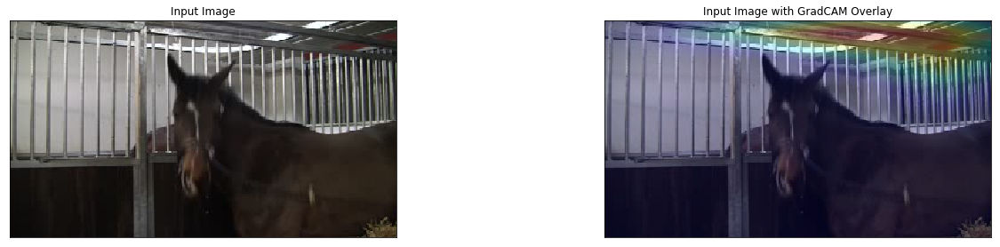

In [40]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  8710
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_1/frame_001333.jpg     1
[[1. 0.]]


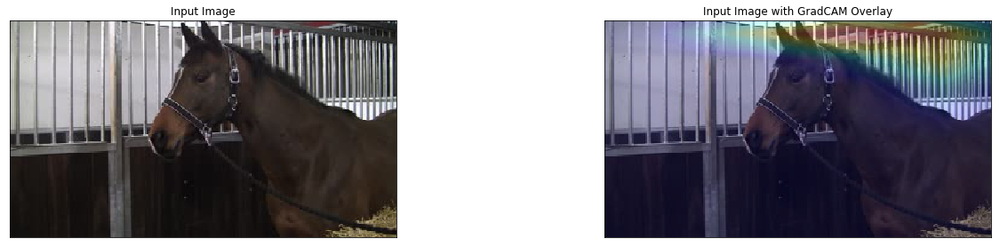

In [41]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  3600
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1b/frame_000935.jpg     0
[[1. 0.]]


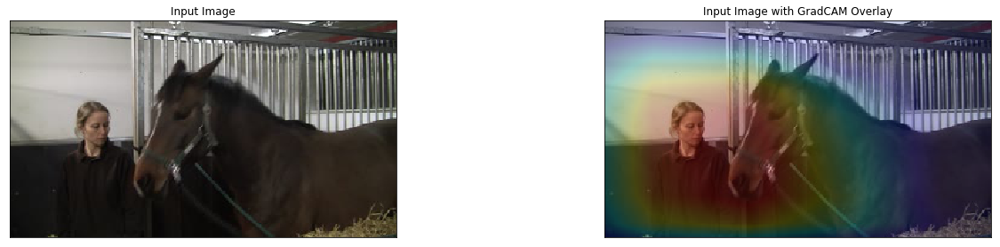

In [42]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  4260
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_000505.jpg     0
[[1. 0.]]


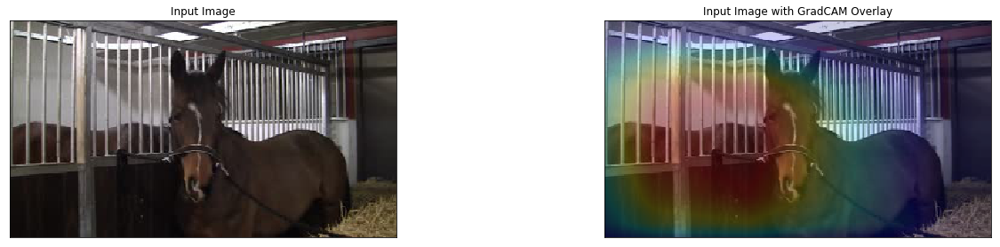

In [43]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  2321
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_002322.jpg     0
[[1. 0.]]


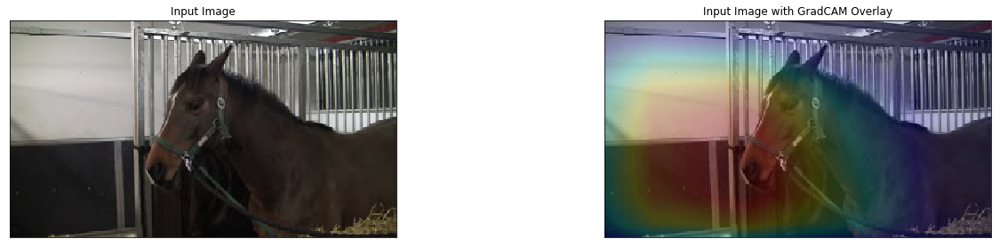

In [44]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  674
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_000675.jpg     0
[[1. 0.]]


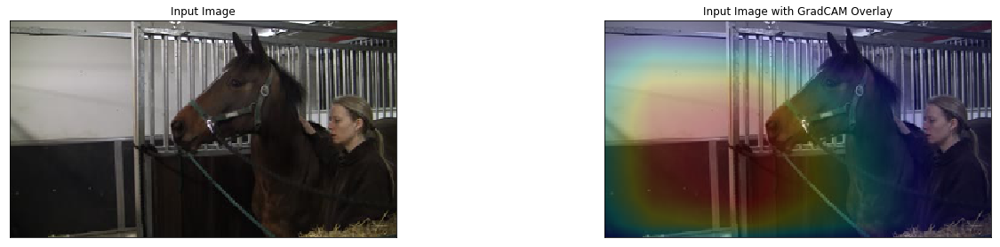

In [45]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  11132
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_000455.jpg     1
[[1. 0.]]


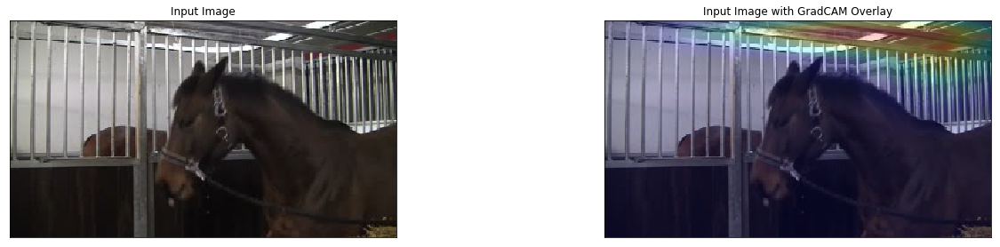

In [46]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  11099
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_000422.jpg     1
[[1. 0.]]


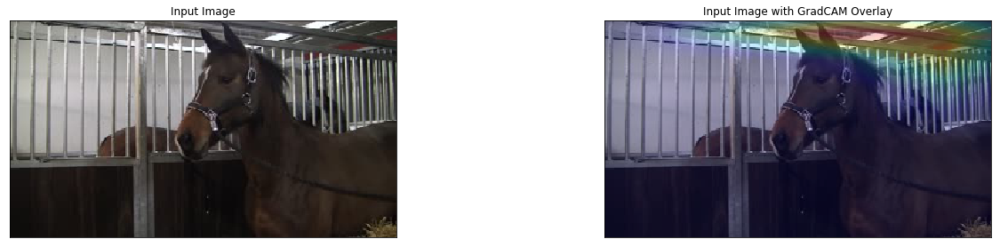

In [47]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  4805
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_001050.jpg     0
[[1. 0.]]


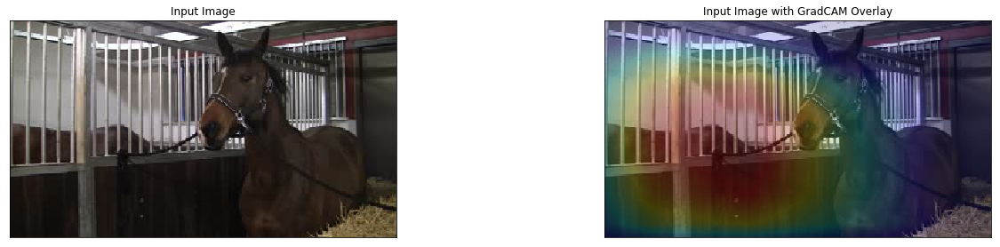

In [48]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  2504
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_002505.jpg     0
[[1. 0.]]


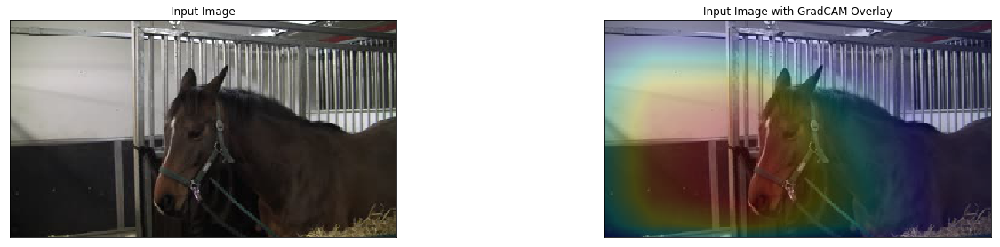

In [49]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  11112
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_000435.jpg     1
[[1. 0.]]


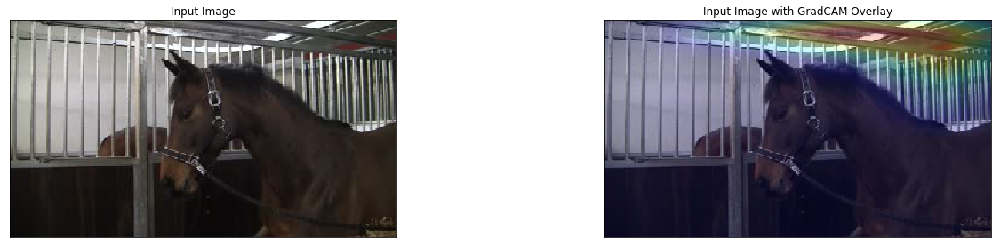

In [50]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  9916
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_2/frame_000859.jpg     1
[[1. 0.]]


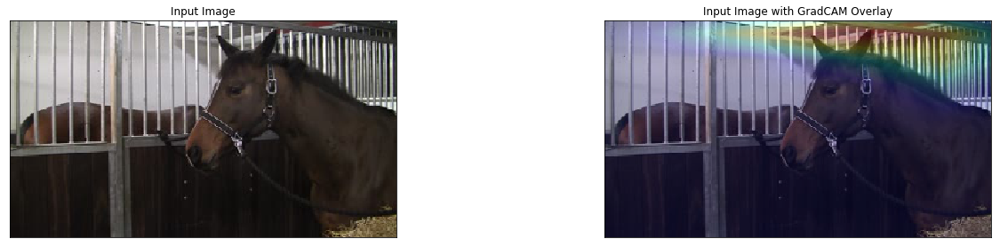

In [51]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  4291
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_000536.jpg     0
[[1. 0.]]


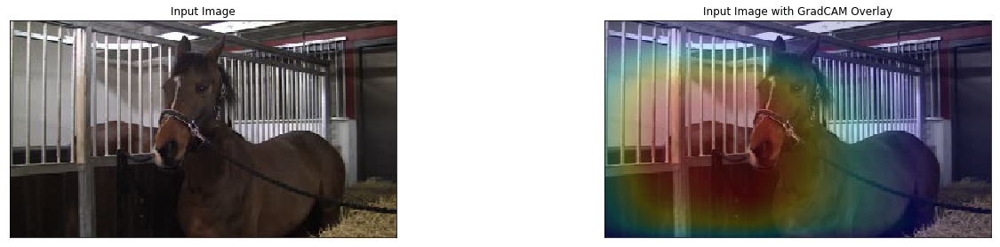

In [52]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  2627
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_002628.jpg     0
[[1. 0.]]


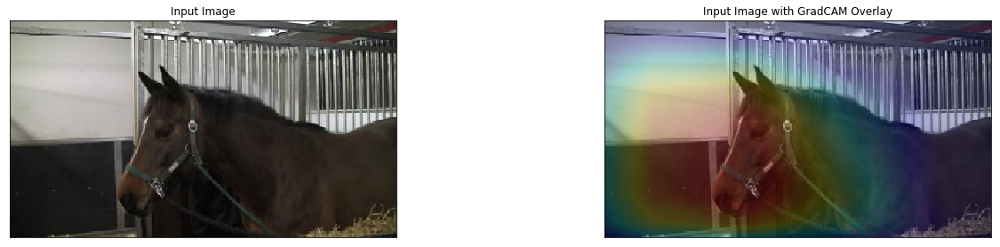

In [53]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  9913
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_2/frame_000856.jpg     1
[[1. 0.]]


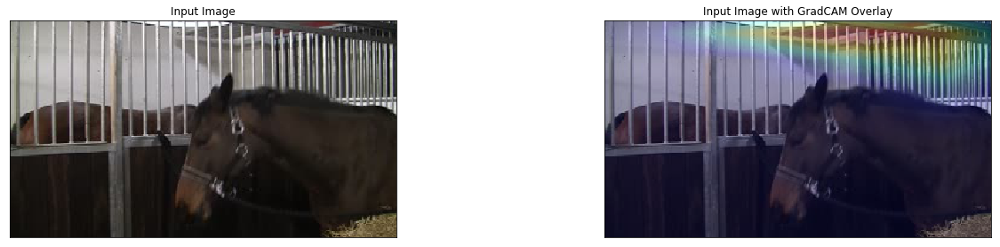

In [54]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  3659
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1b/frame_000994.jpg     0
[[1. 0.]]


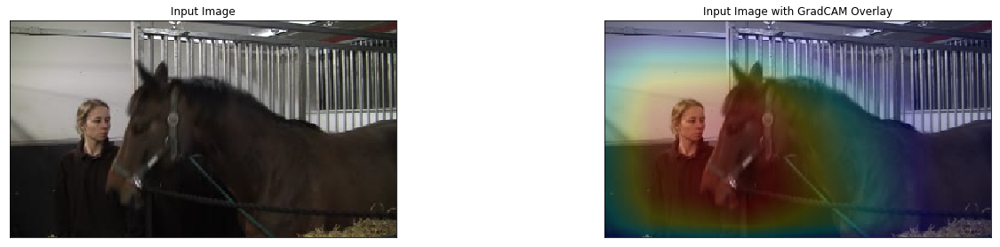

In [55]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  12098
                                                 Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_4/frame_001421.jpg     1
[[1. 0.]]


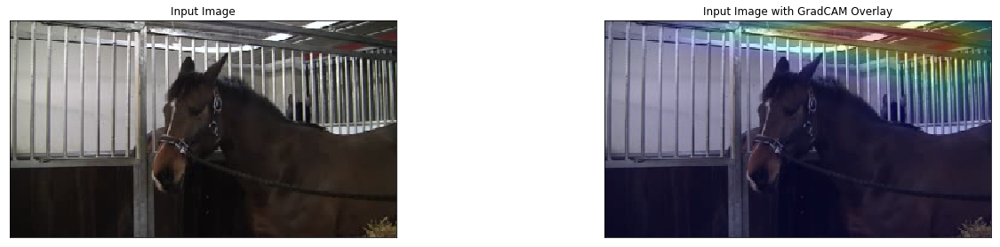

In [56]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  10076
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_2/frame_001019.jpg     1
[[1. 0.]]


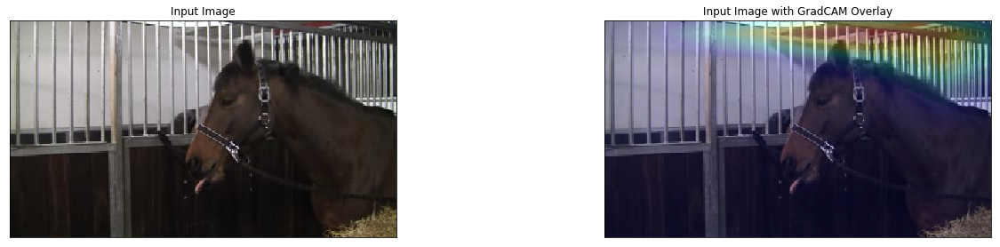

In [57]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  2443
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1a/frame_002444.jpg     0
[[1. 0.]]


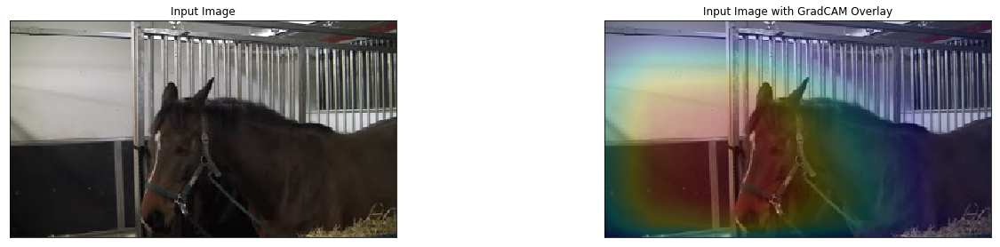

In [58]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  9682
                                                    Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_3a_2/frame_000625.jpg     1
[[1. 0.]]


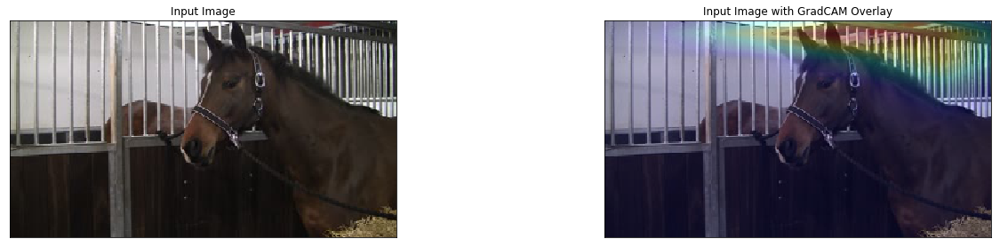

In [59]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  6695
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2b/frame_000276.jpg     0
[[1. 0.]]


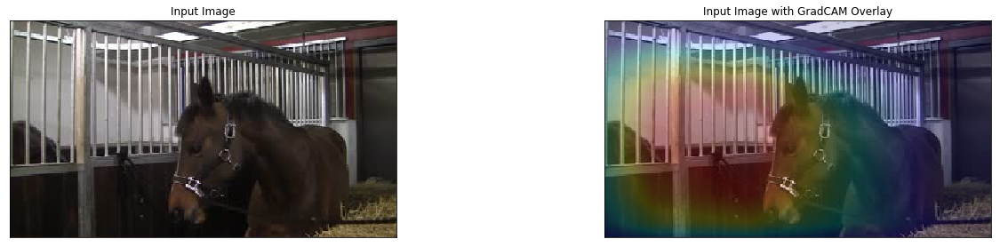

In [60]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  4420
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_2a/frame_000665.jpg     0
[[1. 0.]]


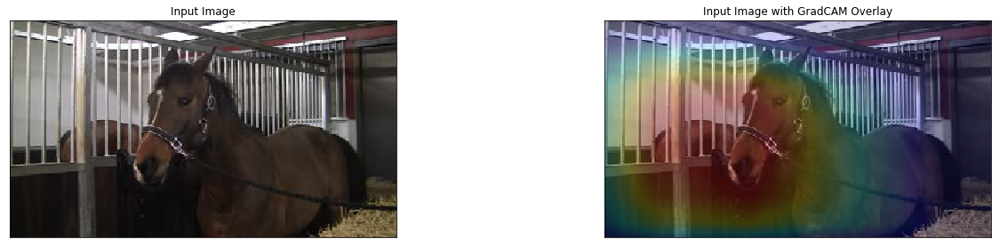

In [61]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)

Chose subject  1
Start index in subject dataframe:  3531
                                                  Path  Pain
0  data/jpg_320_180_2fps/horse_2/2_1b/frame_000866.jpg     0
[[1. 0.]]


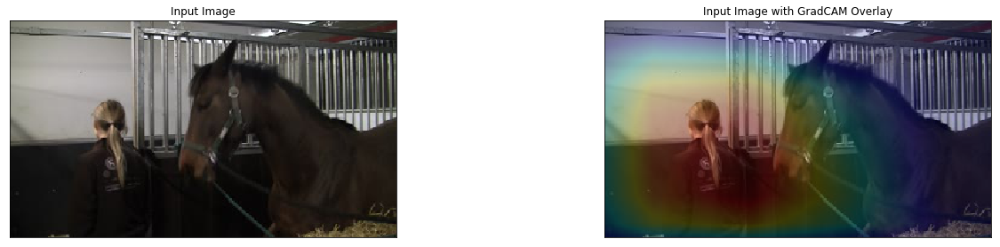

In [62]:
batch_img, batch_label = utils.data_for_one_random_sequence_4D(args, subject_dfs, computer='local', subject=1)
batch_img = np.array(batch_img, dtype=np.float32)
batch_label = np.array(batch_label, dtype=np.uint8)
run_on_one_sequence(sess, model, batch_img)